In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


<h1 style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> ❤️ COMPUTER VISION ❤️ </center> </h1>

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Computer Vision is a field of Computer Science that helps computers understand and interpret the visual world around us. It makes use of the images and videos captured on cameras to develop models and techniques to process and analyze the underlying features. Computer Vision is a strong pillar of Artificial Intelligence that has wide-ranging applications in diverse domains.</p>

<h1 style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🎤 DESCRIPTION 🎤 </center> </h1>

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> This notebook intends to explore Computer Vision using OpenCV. OpenCV is a popular, free, and open-source library for Computer Vision developed by Intel. This notebook will discuss fundamental Computer Vision concepts and their implementations by playing around with the library and harnessing its functionalities. Please upvote and share the notebook if you found it helpful in any way. Thank you in advance! <br><br> Note: <br> 📌 All images are sourced from the internet. <br> 📌 Reference: <a href = "https://opencv-python-tutroals.readthedocs.io/en/latest/index.html"> OpenCV Documentation </a> </p>



<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/3/32/OpenCV_Logo_with_text_svg_version.svg/1200px-OpenCV_Logo_with_text_svg_version.svg.png" width="200" height="200" />

<h1 id = 'sec1' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 📚 IMPORT LIBRARIES 📚 </center> </h1>

## **IMPORT LIBRARIES**

In [ ]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

<h1 id = 'sec2' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🌈 RGB IMAGE AND RESIZING 🌈 </center> </h1>

## **RGB IMAGE AND RESIZING**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> An RGB picture, where RGB stands for Red, Green, and Blue, is made up of three images layered on top of one another. It's also known as a 'True Color Image,' since it closely resembles a real-life image and is based on human colour perception. On cameras, TVs, and computers, the RGB colour model is utilised to show images. <br><br> Because photographs come in a variety of sizes, resizing all of them to the same height and width ensures uniformity and makes processing them easier. Data may be lost in the image if the size is lowered, even though the processing is faster. The image may seem blurry or pixelated when the size is raised. Interpolation is commonly used to fill in missing data.</p>

In [ ]:
!wget https://img.freepik.com/free-vector/abstract-scribble-icons-hand-drawn-doodle-coloring_179234-222.jpg?w=2000

--2022-09-24 07:30:46--  https://img.freepik.com/free-vector/abstract-scribble-icons-hand-drawn-doodle-coloring_179234-222.jpg?w=2000
Resolving img.freepik.com (img.freepik.com)... 104.81.140.75, 2a02:26f0:fe00:494::312e, 2a02:26f0:fe00:4a9::312e
Connecting to img.freepik.com (img.freepik.com)|104.81.140.75|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 575404 (562K) [image/jpeg]
Saving to: ‘abstract-scribble-icons-hand-drawn-doodle-coloring_179234-222.jpg?w=2000’

abstract-scribble-i 100%[===================>] 561.92K  --.-KB/s    in 0.02s   

2022-09-24 07:30:46 (31.0 MB/s) - ‘abstract-scribble-icons-hand-drawn-doodle-coloring_179234-222.jpg?w=2000’ saved [575404/575404]



In [ ]:
height = 200
width = 200
font_size = 10
paths = ['/content/baby.jpg', '/content/bab2.jpg','/content/baby2.jpg']

image is of the original size


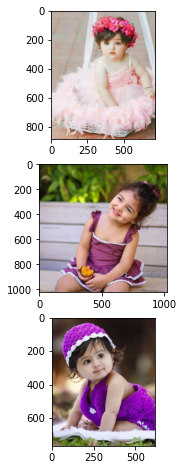

In [ ]:
plt.figure(figsize=(20, 8))
print("image is of the original size")
for i, path in enumerate(paths):
    name = os.path.split(path)
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    plt.subplot(3, 1, i+1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

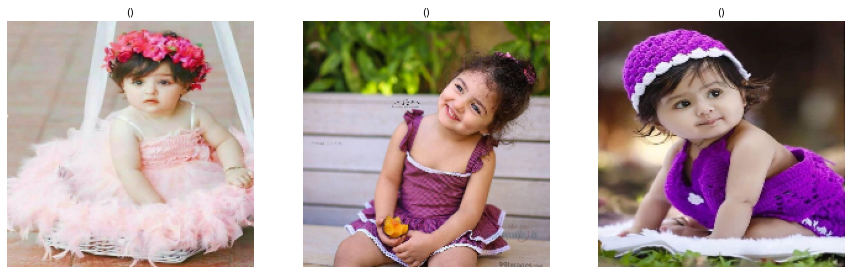

In [ ]:
plt.figure(figsize=(15, 8))
for i, path in enumerate(paths):
    
    name = os.path.split(path)
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    resized_img = cv2.resize(img, (height, width))
        
    plt.subplot(1, 3, i+1).set_title(name[ : -4], fontsize = font_size); plt.axis('off')
    plt.imshow(cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB))
    cv2.imwrite("/content/saved images/{}.jpg".format(i),resized_img)
plt.show()

<h1 id = 'sec3' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 📓 GRAYSCALE IMAGE 📓 </center> </h1>

## **GRAYSCALE IMAGE**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Pictures that are shades of grey are known as grayscale images. It holds the intensity information of pixels in the picture and represents the degree of brightness. The weakest intensity is black, while the greatest is white. Grayscale photos are efficient because they are simpler and faster to process than colour images. Some of these techniques will be discussed in further depth in the notebook. </p>

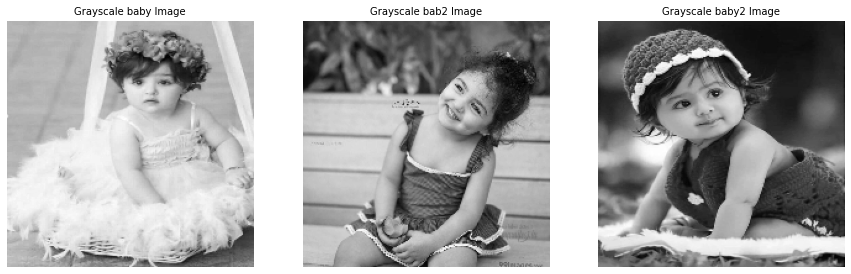

In [ ]:
plt.figure(figsize=(15, 8))
for i, path in enumerate(paths):
    name = os.path.split(path)[-1]
    img = cv2.imread(path, 0)
    resized_img = cv2.resize(img, (height, width))
    plt.subplot(1, 3, i + 1).set_title(f'Grayscale {name[ : -4]} Image', fontsize = font_size); plt.axis('off')
    plt.imshow(resized_img, cmap='gray')
plt.show()

<h1 id = 'sec4' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🔇 IMAGE DENOISING 🔇 </center> </h1>

## **IMAGE DENOISING**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Picture denoising is the process of removing noise from an image. 'Image Smoothing' is another name for it. A low pass filter kernel is applied to the picture, which removes high-frequency material such as image edges. There are a variety of picture blurring methods available, including the ones listed below.


Averaging - Image blurring in which the average of all pixels in the kernel region replaces the core element.
Gaussian Filtering - Using the Gaussian function to blur an image
Image blurring in which the median of all pixels in the kernel region replaces the primary element.
Bilateral Filtering - Image blurring in which each pixel's intensity is replaced by a weighted average of intensity values from surrounding pixels.

In the implementation below, median filtering is used. It efficiently lowers salt and pepper noise since all of the primary pieces are replaced with pixel values that were already present in the image. 
</p>

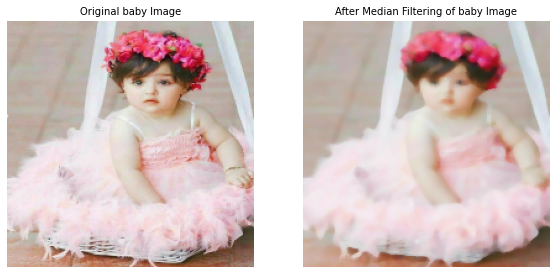

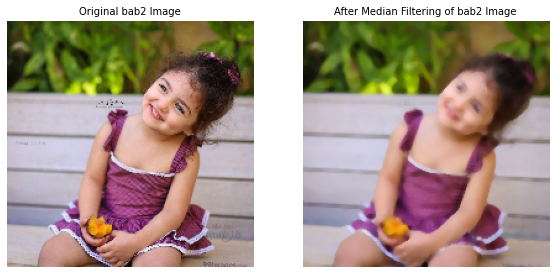

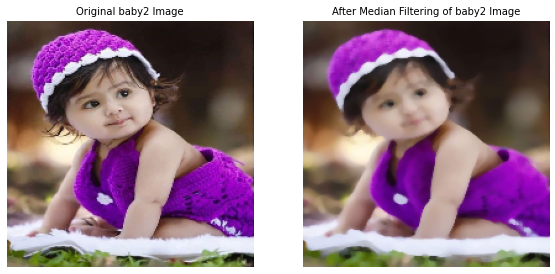

In [ ]:
for i, path in enumerate(paths):
    
    name = os.path.split(path)[-1]
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    resized_img = cv2.resize(img, (height, width))
    
    denoised_img = cv2.medianBlur(resized_img, 5)
    
    plt.figure(figsize=(15, 8))
    plt.subplot(1, 3, 1).set_title(f'Original {name[ : -4]} Image', fontsize = font_size); plt.axis('off')
    plt.imshow(cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB))
    plt.subplot(1, 3, 2).set_title(f'After Median Filtering of {name[ : -4]} Image', fontsize = font_size); plt.axis('off')
    plt.imshow(cv2.cvtColor(denoised_img, cv2.COLOR_BGR2RGB))
    plt.show()

<h1 id = 'sec5' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> ⏲ IMAGE THRESHOLDING ⏲ </center> </h1>

## **IMAGE THRESHOLDING**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Image Thresholding is self-explanatory. If the pixel value in an image is above a certain threshold, a particular value is assigned and if it is below the threshold, another particular value is assigned. There are many thresholding styles as follows. </p>


<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> There are no global threshold values in Adaptive Thresholding. Instead, a threshold for a tiny area of the picture is specified. As a result, distinct thresholds exist for the entire image, and they yield better results when the lighting is varied. The following are the many Adaptive Thresholding methods: <br><br> 📌 cv2.ADAPTIVE_THRESH_MEAN_C - Threshold is the mean of the neighborhood area values <br> 📌 cv2.ADAPTIVE_THRESH_GAUSSIAN_C - Threshold is the weighted sum of the neighborhood area values <br><br> Adaptive Thresholding is implemented below.</p>

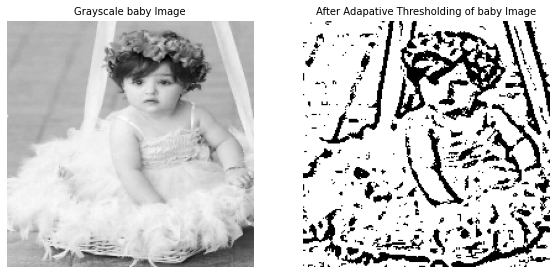

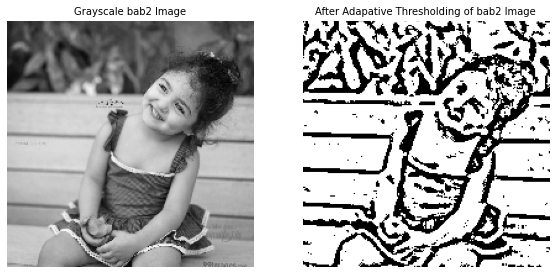

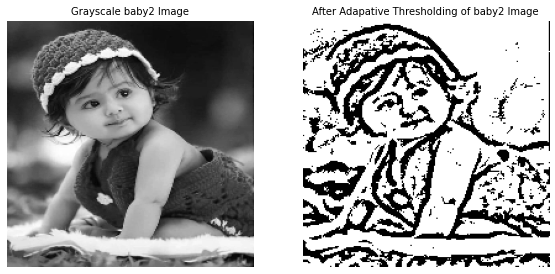

In [ ]:
for i, path in enumerate(paths):
    
    name = os.path.split(path)[-1]
    img = cv2.imread(path, 0)
    resized_img = cv2.resize(img, (height, width))
    denoised_img = cv2.medianBlur(resized_img, 5)
    
    th = cv2.adaptiveThreshold(denoised_img, maxValue = 255, adaptiveMethod = cv2.ADAPTIVE_THRESH_GAUSSIAN_C, thresholdType = cv2.THRESH_BINARY, blockSize = 11, C = 2)
    
    plt.figure(figsize=(15, 8))
    plt.subplot(1, 3, 1).set_title(f'Grayscale {name[ : -4]} Image', fontsize = font_size); plt.axis('off')
    plt.imshow(resized_img, cmap = 'gray')
    plt.subplot(1, 3, 2).set_title(f'After Adapative Thresholding of {name[ : -4]} Image', fontsize = font_size); plt.axis('off')
    plt.imshow(cv2.cvtColor(th, cv2.COLOR_BGR2RGB))
    plt.show()

<h1 id = 'sec6' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 💚 IMAGE GRADIENTS 💜 </center> </h1>

## **IMAGE GRADIENTS**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Gradients are the slopes of the function's tangent graphs. In the x and y directions, image gradients detect the edges of a grayscale picture. This may be accomplished by employing Sobel x and Sobel y procedures to calculate derivates in both directions. The following connection combines these two derivatives to obtain the laplacian derivatives. </p>


<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'>The transition from white to black is known as 'Positive Slope,' whereas the transition from black to white is known as 'Negative Slope.' When the output datatype is int8, several edge detections are missed. As a result, for all edge detections, having the output datatype as float64 is a superior alternative. </p> 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


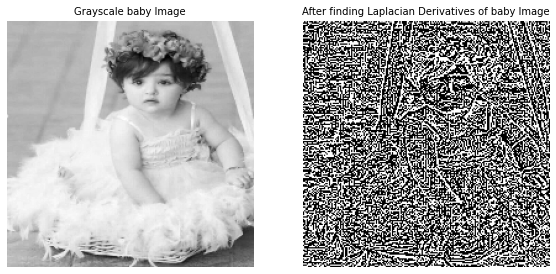

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


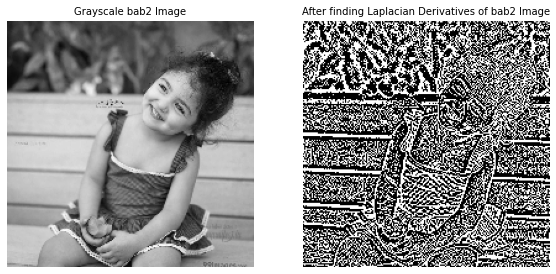

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


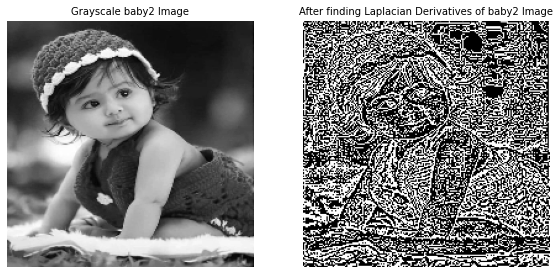

In [ ]:
for i, path in enumerate(paths):
    
    name = os.path.split(path)[-1]
    img = cv2.imread(path, 0)
    resized_img = cv2.resize(img, (height, width))
    laplacian = cv2.Laplacian(resized_img, cv2.CV_64F)
    
    plt.figure(figsize=(15, 8))
    plt.subplot(1, 3, 1).set_title(f'Grayscale {name[ : -4]} Image', fontsize = font_size); plt.axis('off')
    plt.imshow(resized_img, cmap = 'gray')
    plt.subplot(1, 3, 2).set_title(f'After finding Laplacian Derivatives of {name[ : -4]} Image', fontsize = font_size); plt.axis('off')
    plt.imshow(cv2.cvtColor(laplacian.astype('float32'), cv2.COLOR_BGR2RGB))
    plt.show()

<h1 id = 'sec7' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🔍 EDGE DETECTION 🔍 </center> </h1>

## **EDGE DETECTION**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Canny Edge Detection is a multi-stage technique that is used to detect edges. The following are the steps to achieving edge detection. <br><br> 📌 Noise Reduction - Smoothen image using Gaussian filter <br> 📌 Find Intensity Gradient -Find the first derivative in the horizontal (Gx) and vertical (Gy) directions using the Sobel kernel. The gradient of the edge is calculated using the formula below. </p>


<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> 📌 Non-maximum Suppression - Remove unneeded pixels that aren't edges by determining if there is a local maximum in its vicinity in the gradient's direction. <br> 📌 Hysteresis Thresholding - Determine whether all of the edges are, in fact, edges. The minVal and maxVal thresholds are the two options. Edges that are above the maxVal are sure edges, whereas those that are below the minVal are not. If the edges in between are related to a certain edge, they are edges; otherwise, they are not. </p>

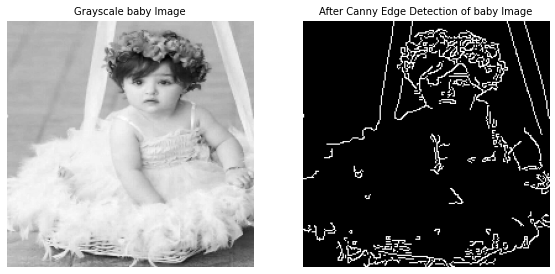

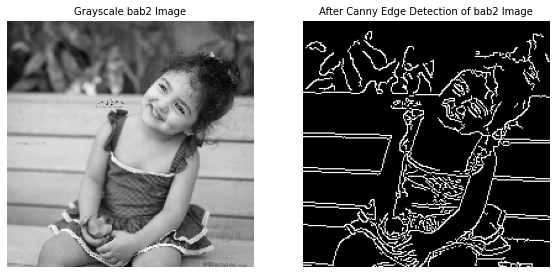

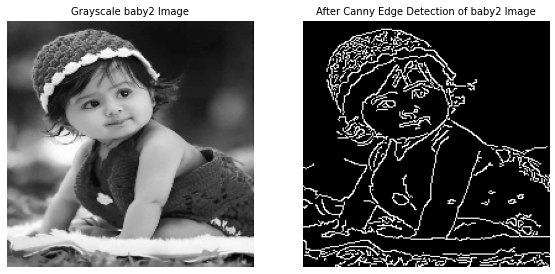

In [ ]:
for i, path in enumerate(paths):
    
    name = os.path.split(path)[-1]
    img = cv2.imread(path, 0)
    resized_img = cv2.resize(img, (height, width))
    edges = cv2.Canny(resized_img, threshold1 = 100, threshold2 = 200)
    
    plt.figure(figsize=(15, 8))
    plt.subplot(1, 3, 1).set_title(f'Grayscale {name[ : -4]} Image', fontsize = font_size); plt.axis('off')
    plt.imshow(resized_img, cmap = 'gray')
    plt.subplot(1, 3, 2).set_title(f'After Canny Edge Detection of {name[ : -4]} Image', fontsize = font_size); plt.axis('off')
    plt.imshow(cv2.cvtColor(edges, cv2.COLOR_BGR2RGB))
    plt.show()

<h1 id = 'sec8' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🌟 FOURIER TRANSFORM ON IMAGE 🌟 </center> </h1>

## **FOURIER TRANSFORM ON IMAGE**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> The Fourier Transform examines an image's frequency properties. The frequency domain is determined using the discrete Fourier Transform. The Discrete Fourier Transform is calculated using the Fast Fourier Transform (FFT). The frequency is generally greater near the margins or where there is noise. When FFT is applied to a picture, the high frequency is concentrated in the image's corners. It is moved by N/2 in both horizontal and vertical dimensions to bring it to the image's centre. Finally, the outcome's magnitude spectrum is determined. Because each item has its own magnitude spectrum, the Fourier Transform is useful in object detection.</p>

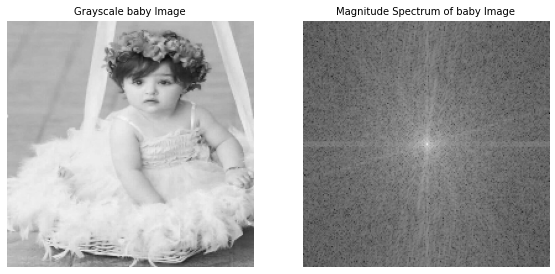

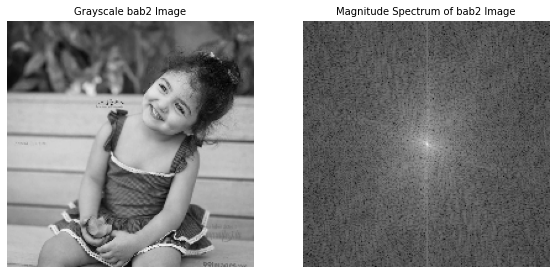

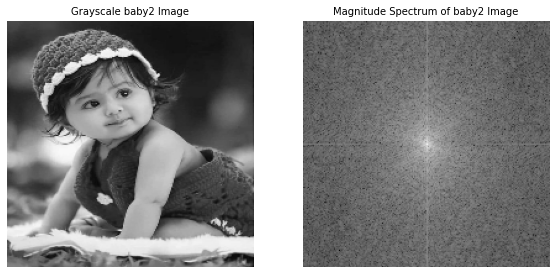

In [ ]:
for i, path in enumerate(paths):
    
    name = os.path.split(path)[-1]
    img = cv2.imread(path, 0)
    resized_img = cv2.resize(img, (height, width))
    
    freq = np.fft.fft2(resized_img)
    
    freq_shift = np.fft.fftshift(freq)
    
    magnitude_spectrum = 20 * np.log(np.abs(freq_shift))

    plt.figure(figsize=(15, 8))
    plt.subplot(1, 3, 1).set_title(f'Grayscale {name[ : -4]} Image', fontsize = font_size); plt.axis('off')   
    plt.imshow(cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB))
    plt.subplot(1, 3, 2).set_title(f'Magnitude Spectrum of {name[ : -4]} Image', fontsize = font_size); plt.axis('off')   
    plt.imshow(magnitude_spectrum, cmap = 'gray')
    plt.show()

<h1 id = 'sec9' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> ✏ LINE TRANSFORM ✏ </center> </h1>

## **LINE TRANSFORM**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'>When expressed in mathematical form, the Hough Transform can recognise any shape, even if it is deformed. The polar coordinate system of a line in the cartesian coordinate system y = mx + c is rho = xcos + ysin. rho is the perpendicular distance between the origin and the line, and is the clockwise angle formed by the horizontal axis and the perpendicular line. As a result, the line is denoted by these two words (rho, ). For these two terms, an array is generated, with rho forming the rows and forming the columns. The accumulator is what it's called. rho is the accumulator's distance resolution in pixels, and is the accumulator's angle resolution in radians. The (x, y) values of each line may be converted to (rho, ) values. The accumulator is increased for each (rho, ) pair.</p>

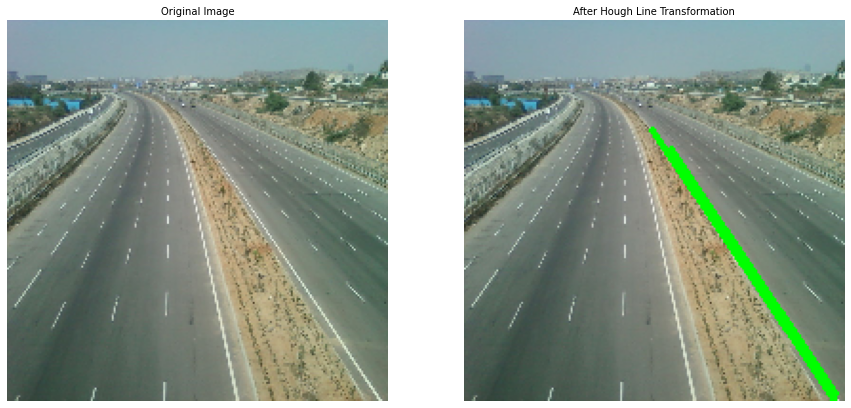

In [ ]:
min_line_length = 100
max_line_gap = 10

img = cv2.imread('/content/6 lanes highway.jfif')
resized_img = cv2.resize(img, (height, width))
img_copy = resized_img.copy()

edges = cv2.Canny(resized_img, threshold1 = 50, threshold2 = 150)

lines = cv2.HoughLinesP(edges, rho = 1, theta = np.pi / 180, threshold = 100, minLineLength = min_line_length, maxLineGap = max_line_gap)

for line in lines:
    for x1, y1, x2, y2 in line:
        hough_lines_img = cv2.line(resized_img ,(x1,y1),(x2,y2),color = (0,255,0), thickness = 2)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1).set_title('Original Image', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
plt.subplot(1, 2, 2).set_title('After Hough Line Transformation', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(hough_lines_img, cv2.COLOR_BGR2RGB))
plt.show()

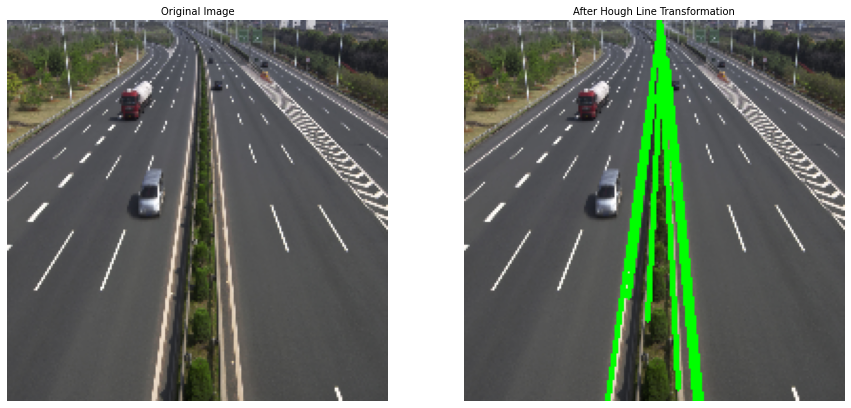

In [ ]:
min_line_length = 100
max_line_gap = 10

img = cv2.imread('/content/6 lanes hight way png image.png')
resized_img = cv2.resize(img, (height, width))
img_copy = resized_img.copy()

edges = cv2.Canny(resized_img, threshold1 = 50, threshold2 = 150)

lines = cv2.HoughLinesP(edges, rho = 1, theta = np.pi / 180, threshold = 100, minLineLength = min_line_length, maxLineGap = max_line_gap)

for line in lines:
    for x1, y1, x2, y2 in line:
        hough_lines_img = cv2.line(resized_img ,(x1,y1),(x2,y2),color = (0,255,0), thickness = 2)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1).set_title('Original Image', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
plt.subplot(1, 2, 2).set_title('After Hough Line Transformation', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(hough_lines_img, cv2.COLOR_BGR2RGB))
plt.show()

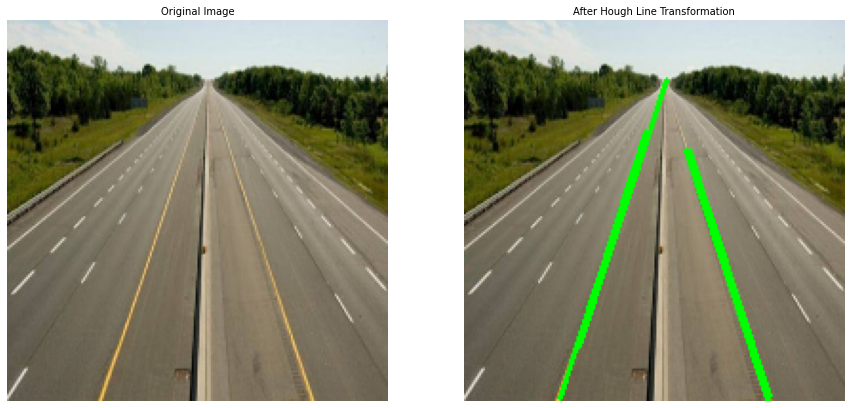

In [ ]:
min_line_length = 100
max_line_gap = 10

img = cv2.imread('/content/infrastructure-660.jpg')
resized_img = cv2.resize(img, (height, width))
img_copy = resized_img.copy()

edges = cv2.Canny(resized_img, threshold1 = 50, threshold2 = 150)

lines = cv2.HoughLinesP(edges, rho = 1, theta = np.pi / 180, threshold = 100, minLineLength = min_line_length, maxLineGap = max_line_gap)

for line in lines:
    for x1, y1, x2, y2 in line:
        hough_lines_img = cv2.line(resized_img ,(x1,y1),(x2,y2),color = (0,255,0), thickness = 2)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1).set_title('Original Image', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
plt.subplot(1, 2, 2).set_title('After Hough Line Transformation', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(hough_lines_img, cv2.COLOR_BGR2RGB))
plt.show()

<h1 id = 'sec10' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🔲 CORNER DETECTION 🔳 </center> </h1>

## **CORNER DETECTION**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> To identify a corner, Harris Corner detects the difference in intensity for a displacement in all directions. The following is a mathematical equation. </p>
![1-min.png](https://i.stack.imgur.com/R7UV0.png)

Source : https://i.stack.imgur.com/R7UV0.png


<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> A rectangular window or a Gaussian window can be used as a window function. For corner detection, E(u, v) must be maximised, which means the second term must also be maximised. We derive the following equation by using Taylor's Expansion to the preceding equation. Sobel procedures can be used to get Ix and Iy derivatives in the horizontal and vertical directions. </p> 

![2-min.png](https://2.bp.blogspot.com/-y9KGeTKBP5Q/TvHC2WaqotI/AAAAAAAAAio/UGtwxQm07Is/s1600/sobel_formula.bmp)

Source : https://2.bp.blogspot.com/-y9KGeTKBP5Q/TvHC2WaqotI/AAAAAAAAAio/UGtwxQm07Is/s1600/sobel_formula.bmp


<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Finally, the equation given above decides whether a corner is detected or not. </p> 

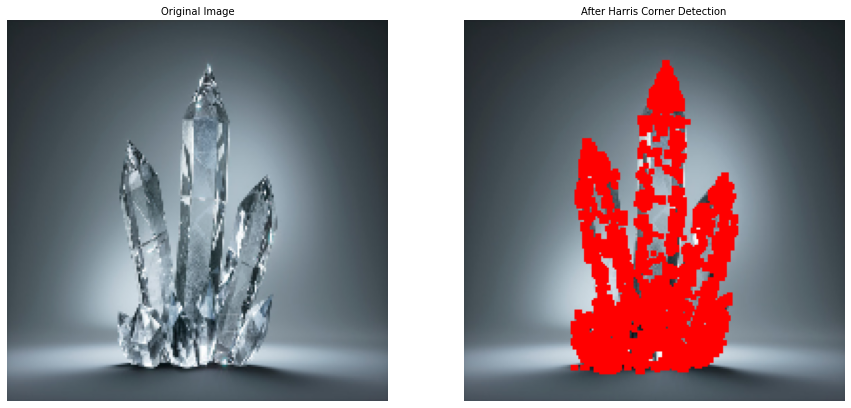

In [ ]:
img = cv2.imread('/content/crystal.jpg')
resized_img = cv2.resize(img, (height, width))
img_copy = resized_img.copy()
gray = cv2.cvtColor(resized_img,cv2.COLOR_BGR2GRAY)

gray = np.float32(gray)
corners = cv2.cornerHarris(gray, blockSize = 2, ksize = 3, k = 0.04)

corners = cv2.dilate(corners, None)
resized_img[corners > 0.0001 * corners.max()] = [0, 0, 255]

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1).set_title('Original Image', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
plt.subplot(1, 2, 2).set_title('After Harris Corner Detection', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB))
plt.show()

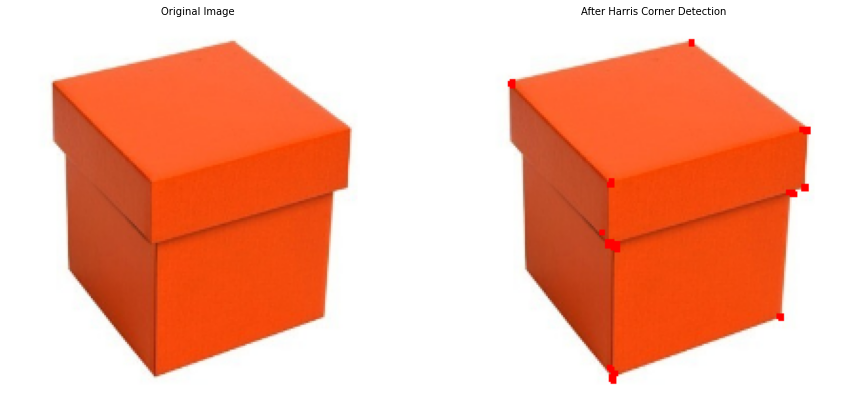

In [ ]:
img = cv2.imread('/content/box-500x500.jpg')
resized_img = cv2.resize(img, (height, width))
img_copy = resized_img.copy()
gray = cv2.cvtColor(resized_img,cv2.COLOR_BGR2GRAY)

gray = np.float32(gray)
corners = cv2.cornerHarris(gray, blockSize = 2, ksize = 3, k = 0.04)

corners = cv2.dilate(corners, None)
resized_img[corners > 0.0001 * corners.max()] = [0, 0, 255]

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1).set_title('Original Image', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
plt.subplot(1, 2, 2).set_title('After Harris Corner Detection', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB))
plt.show()

<h1 id = 'sec11' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🦋 MORPHOLOGICAL TRANSFORMATION OF IMAGE  🦋 </center> </h1>

## **MORPHOLOGICAL TRANSFORMATION OF IMAGE**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Morphological Transformation is commonly used on binary images, and it takes as inputs an image and a kernel, which is a structural element. Binary pictures may have flaws such as texture and noise. By accounting for the image's shape, these transformations aid in the correction of these flaws. The following are the several forms of morphological transformations.<br><br> 📌 Erosion - Erodes boundaries of the foreground object <br> 📌 Dilation - Opposite of Erosion <br> 📌 Opening - Erosion followed by Dilation <br> 📌 Closing - Dilation followed by Erosion <br> 📌 Morphological Gradient - Difference between Dilation and Erosion <br> 📌 Top Hat - Difference between the input image and Opening of the image <br> 📌 Black Hat - Difference between Closing of the image and input image <br><br> Morphological Opening and Closing are implemented below. </p>
    

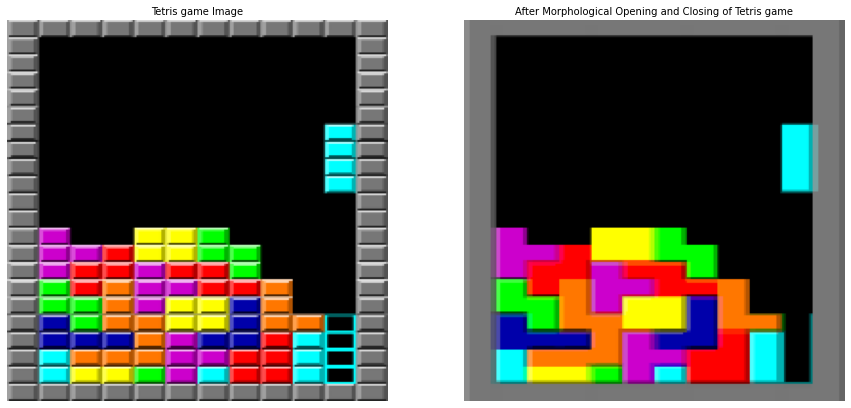

In [ ]:
kernel = np.ones((5,5), np.uint8)

plt.figure(figsize=(15, 8))

img = cv2.imread('/content/640px-Typical_Tetris_Game.png', cv2.IMREAD_COLOR)
resized_img = cv2.resize(img, (height, width))

morph_open = cv2.morphologyEx(resized_img, cv2.MORPH_OPEN, kernel)
morph_close = cv2.morphologyEx(morph_open, cv2.MORPH_CLOSE, kernel)
    
plt.subplot(1,2,1).set_title('Tetris game Image', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB))
plt.subplot(1,2,2).set_title('After Morphological Opening and Closing of Tetris game', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(morph_close, cv2.COLOR_BGR2RGB))
plt.show()

<h1 id = 'sec12' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🎲 GEOMETRIC TRANSFORMATION OF IMAGE  🎲 </center> </h1>

## **GEOMETRIC TRANSFORMATION OF IMAGE**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Two transformation methods, cv2.warpAffine and cv2.warpPerspective, receive a 2x3 and 3x3 transformation matrix, respectively, to perform geometric transformation of pictures. The following are the several types of geometric transformations. <br><br> 📌 Scaling - Resizing the image <br> 📌 Translation - Shifting object's location in the image <br> 📌 Rotation - Rotation of an image by an angle theta <br> 📌 Affine Transformation - All parallel lines remain parallel. Three points in the input image and their corresponding points in the output image are required to find the transformation matrix. <br> 📌 Perspective Transformation - It is similar to Affine Transformation but it is four points instead of three points and three of those four points must be collinear. <br><br> Below is an example of how to use Perspective Transformation. After obtaining the 3x3 transformation matrix using cv2.getPerspectiveTransform, the final converted picture is transformed with cv2.warpPerspective. </p>

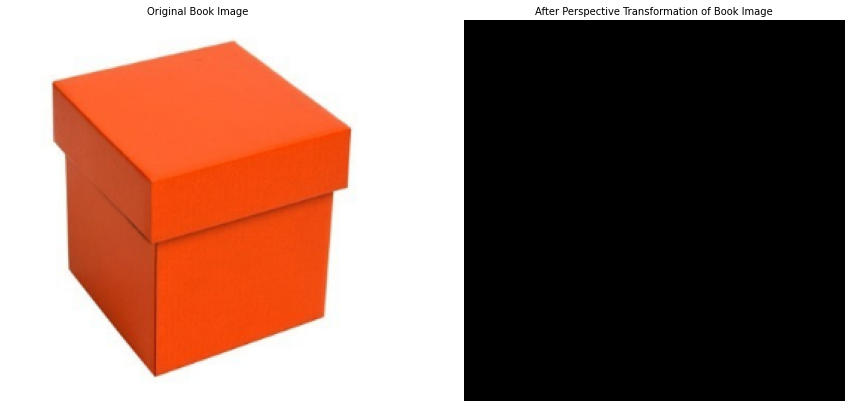

In [ ]:
pts1 = np.float32([[1550, 1170],[2850, 1370],[50, 2600],[1850, 3450]])
pts2 = np.float32([[0,0],[4160,0],[0,3120],[4160,3120]])

img = cv2.imread('/content/box-500x500.jpg', cv2.IMREAD_COLOR)

transformation_matrix = cv2.getPerspectiveTransform(pts1, pts2)

final_img = cv2.warpPerspective(img, M = transformation_matrix, dsize = (4160, 3120))

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (256, 256))
final_img = cv2.cvtColor(final_img, cv2.COLOR_BGR2RGB)
final_img = cv2.resize(final_img, (256, 256))
 
plt.figure(figsize=(15, 8))    
plt.subplot(1,2,1).set_title('Original Book Image', fontsize = font_size); plt.axis('off')   
plt.imshow(img)
plt.subplot(1,2,2).set_title('After Perspective Transformation of Book Image', fontsize = font_size); plt.axis('off')   
plt.imshow(final_img)
plt.show()

<h1 id = 'sec13' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> ⭕ CONTOURS ⭕ </center> </h1>

## **CONTOURS**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Contours are contours in a picture that depict the shape or form of things. They're useful for detecting and recognising objects. Better contours are produced with binary pictures. The functions for locating and drawing contours are separated. </p>

In [ ]:
plt.figure(figsize=(15, 8))

img = cv2.imread('/content/shutterstock_648907024.jpg', cv2.IMREAD_COLOR)
resized_img = cv2.resize(img, (height, width))
contours_img = resized_img.copy()
img_gray = cv2.cvtColor(resized_img,cv2.COLOR_BGR2GRAY)

ret,thresh = cv2.threshold(img_gray, thresh = 127, maxval = 255, type = cv2.THRESH_BINARY)

contours, hierarchy = cv2.findContours(thresh, mode = cv2.RETR_TREE, method = cv2.CHAIN_APPROX_NONE)

cv2.drawContours(contours_img, contours, contourIdx = -1, color = (0, 255, 0), thickness = 2)

plt.subplot(1,2,1).set_title('Original Image', fontsize = font_size); plt.axis('off')   
plt.imshow(resized_img)
plt.subplot(1,2,2).set_title('After Finding Contours', fontsize = font_size); plt.axis('off')   
plt.imshow(contours_img)
plt.show()

NameError: ignored

In [ ]:
plt.figure(figsize=(15, 8))

img = cv2.imread('/content/Pierre-Person.jpg', cv2.IMREAD_COLOR)
resized_img = cv2.resize(img, (height, width))
contours_img = resized_img.copy()
img_gray = cv2.cvtColor(resized_img,cv2.COLOR_BGR2GRAY)

ret,thresh = cv2.threshold(img_gray, thresh = 127, maxval = 255, type = cv2.THRESH_BINARY)

contours, hierarchy = cv2.findContours(thresh, mode = cv2.RETR_TREE, method = cv2.CHAIN_APPROX_NONE)

cv2.drawContours(contours_img, contours, contourIdx = -1, color = (0, 255, 0), thickness = 2)

plt.subplot(1,2,1).set_title('Original Image', fontsize = font_size); plt.axis('off')   
plt.imshow(resized_img)
plt.subplot(1,2,2).set_title('After Finding Contours', fontsize = font_size); plt.axis('off')   
plt.imshow(contours_img)
plt.show()

<h1 id = 'sec14' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🔆 IMAGE PYRAMIDS 🔆 </center> </h1>

## **IMAGE PYRAMIDS**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> The resolution of a picture is the amount of information it contains. Working with photos of varying resolutions is required in certain image processing applications, such as Image Blending, to make the mix seem more genuine. High-resolution photos may be transformed to low-resolution images with OpenCV, and vice versa. When a higher-level picture is converted to a lower-level image, the lower-level image takes up 1/4th of the higher-level image's area. When this is repeated for a number of iterations and the resulting photos are arranged in order, it seems to resemble a pyramid, thus the term 'Image Pyramid.' The following are the two types of pyramids. <br><br> 📌 Gradient Pyramids <br> 📌 Laplacian Pyramids <br><br> The difference between a level in the Gaussian Pyramid and the extended version of that level in the Gaussian Pyramid becomes a level in the Laplacian pyramids. <br><br> The following are the steps for image blending. <br> 📌 Load both images <br> 📌 Find Gaussian Pyramids for both images <br> 📌 Find Laplacian Pyramids for both images <br> 📌 Join the halves of both images on either side in each level of Laplacian Pyramids <br> 📌 Reconstruct image </p>

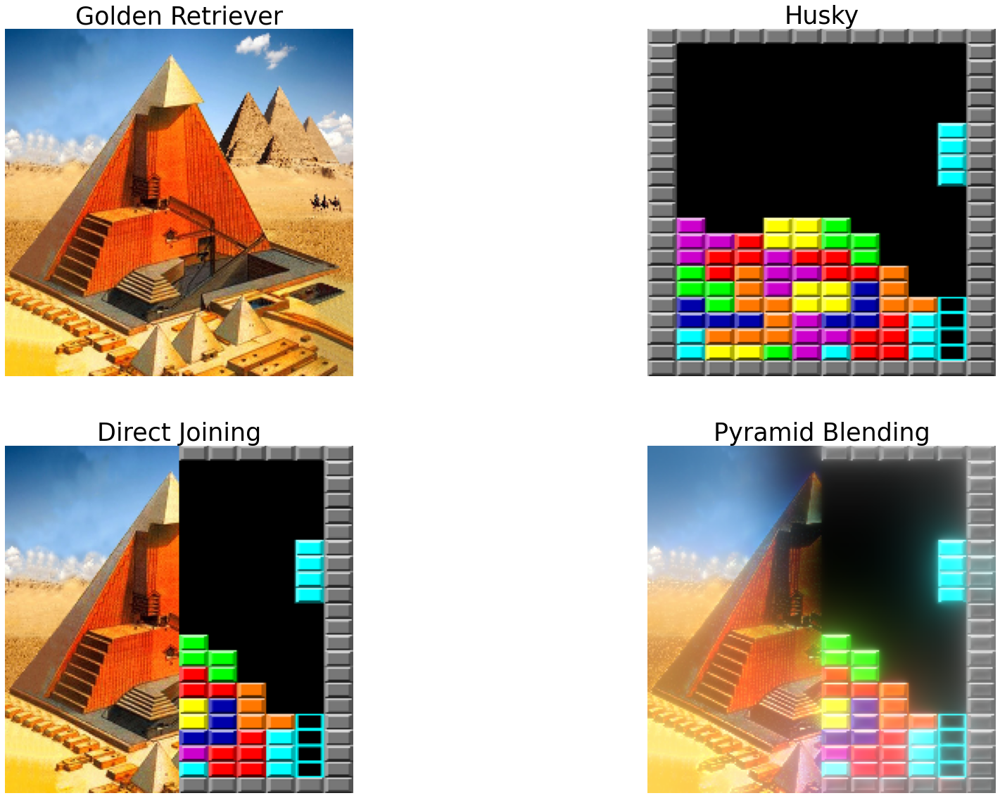

In [ ]:

R = cv2.imread('/content/1_BohvkP5QoYKN_RNSohmofQ.jpeg', cv2.IMREAD_COLOR)
R = cv2.resize(R, (224, 224))
H = cv2.imread('/content/640px-Typical_Tetris_Game.png', cv2.IMREAD_COLOR)
H = cv2.resize(H, (224, 224))

G = R.copy()
guassian_pyramid_c = [G]
for i in range(6):
    G = cv2.pyrDown(G)
    guassian_pyramid_c.append(G)
 
     
G = H.copy()
guassian_pyramid_d = [G]
for i in range(6):
    G = cv2.pyrDown(G)
    guassian_pyramid_d.append(G)

laplacian_pyramid_c = [guassian_pyramid_c[5]]
for i in range(5, 0, -1):
    GE = cv2.pyrUp(guassian_pyramid_c[i])
    L = cv2.subtract(guassian_pyramid_c[i-1], GE)
    laplacian_pyramid_c.append(L)

laplacian_pyramid_d = [guassian_pyramid_d[5]]
for i in range(5,0,-1):
    guassian_expanded = cv2.pyrUp(guassian_pyramid_d[i])
    L = cv2.subtract(guassian_pyramid_d[i-1], guassian_expanded)
    laplacian_pyramid_d.append(L)

laplacian_joined = []
for lc,ld in zip(laplacian_pyramid_c, laplacian_pyramid_d):
    r, c, d = lc.shape
    lj = np.hstack((lc[:, 0 : int(c / 2)], ld[:, int(c / 2) :]))
    laplacian_joined.append(lj)

laplacian_reconstructed = laplacian_joined[0]
for i in range(1,6):
    laplacian_reconstructed = cv2.pyrUp(laplacian_reconstructed)
    laplacian_reconstructed = cv2.add(laplacian_reconstructed, laplacian_joined[i])

direct = np.hstack((R[ : , : int(c / 2)], H[ : , int(c / 2) : ]))

plt.figure(figsize=(30, 20))
plt.subplot(2,2,1).set_title('Golden Retriever', fontsize = 35); plt.axis('off')   
plt.imshow(cv2.cvtColor(R, cv2.COLOR_BGR2RGB))
plt.subplot(2,2,2).set_title('Husky', fontsize = 35); plt.axis('off')   
plt.imshow(cv2.cvtColor(H, cv2.COLOR_BGR2RGB))
plt.subplot(2,2,3).set_title('Direct Joining', fontsize = 35); plt.axis('off')   
plt.imshow(cv2.cvtColor(direct, cv2.COLOR_BGR2RGB))
plt.subplot(2,2,4).set_title('Pyramid Blending', fontsize = 35); plt.axis('off')   
plt.imshow(cv2.cvtColor(laplacian_reconstructed, cv2.COLOR_BGR2RGB))
plt.show()

<h1 id = 'sec15' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🧡 COLORSPACE CONVERSION AND OBJECT TRACKING 💛 </center> </h1>



<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'>BGRGray and BGRHSV conversions are possible in Colorspace Conversion. The BGRGray conversion has been observed before. Hue, Saturation, and Value are all abbreviated as HSV. Object identification is considerably easier with HSV images than with RGB photos because HSV characterises images in terms of hue, saturation, and value rather than RGB where R, G, and B are all co-related to colour brightness. <br><br>
Steps for Object Tracking are listed below: <br> 📌 Convert Image from BGR to HSV <br> 📌 Threshold the HSV image to extract the pixels that are in a range of one's color of choice (Color White is chosen to extract the cat in the implementation below) <br> 📌 The remaining unextracted pixels are filled by pixels from another image (maybe background image) of one's choice / Anything can be done with the extracted object [Optional] </p>

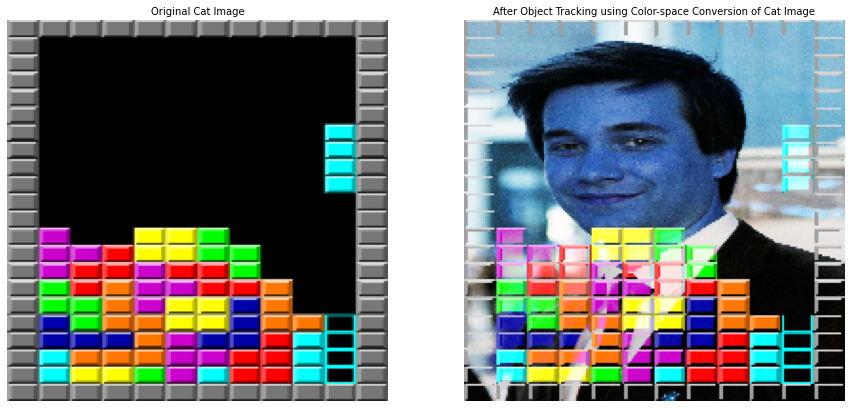

In [ ]:
lower_white = np.array([0, 0, 150])
upper_white = np.array([255, 255, 255])

img = cv2.imread('/content/640px-Typical_Tetris_Game.png', cv2.IMREAD_COLOR)
img = cv2.resize(img, (height, width))

background = cv2.imread("/content/Pierre-Person.jpg", cv2.IMREAD_COLOR)
background = cv2.resize(background, (height, width))

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

mask = cv2.inRange(hsv_img, lowerb = lower_white, upperb = upper_white)

final_img = cv2.bitwise_and(img, img, mask = mask)
final_img = np.where(final_img == 0, background, final_img)

plt.figure(figsize=(15, 8))
plt.subplot(1,2,1).set_title('Original Cat Image', fontsize = font_size); plt.axis('off')   
plt.imshow(img)
plt.subplot(1,2,2).set_title('After Object Tracking using Color-space Conversion of Cat Image', fontsize = font_size); plt.axis('off')   
plt.imshow(final_img)
plt.show()

<h1 id = 'sec16' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> ✔️ INTERACTIVE FOREGROUND EXTRACTION ✔️ </center> </h1>

## **INTERACTIVE FOREGROUND EXTRACTION**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> The image's foreground is extracted using user input and the Gaussian Mixture Model (GMM). The procedures for removing the foreground of an image are as follows. <br><br>📌 Initial Labeling - Computer does initial labelling based on the provided labels. 


📌User Input - User gives a rectangle zone where all pixels outside of it are sure backdrop and everything inside is uncertain.


📌GMM - Models the foreground and background GMM creates new pixel distribution - Based on the data, the model predicts a likely foreground or background for the unknown pixels (similar to Clustering) 


📌Build Graph - A graph is built for all the pixels, with all foreground pixels connected to Source Node and all background pixels connected to Sink Node. The similarity between the linked nodes is represented by the weights between the pixels. The chance of a pixel being a foreground or background pixel determines the weight of the edges linked to Source or Sink Node.


📌Mincut Algorithm - It divides the graph into two segments, one having the Source Node and the other containing the Sink Node, both with the lowest cost function. The cost is equal to the sum of all the edge weights in the segment.


📌Repeat - Iterate a few times until the categorization converges.

GrabCut is used to modify the mask. Pixels are labelled with four flags, with 0 and 2 indicating the background and 1 and 3 indicating the foreground, respectively. </p>

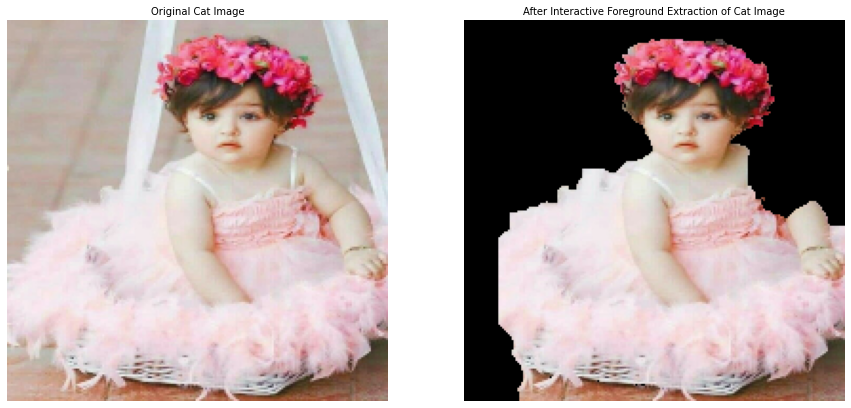

In [ ]:
img = cv2.imread('/content/baby.jpg', cv2.IMREAD_COLOR)
img = cv2.resize(img, (height, width))
img_copy = img.copy()
mask = np.zeros(img.shape[ : 2], np.uint8)

background_model = np.zeros((1,65),np.float64)
foreground_model = np.zeros((1,65),np.float64)

rect = (10, 10, 224, 224)

cv2.grabCut(img, mask = mask, rect = rect, bgdModel = background_model, fgdModel = foreground_model, iterCount = 5, mode = cv2.GC_INIT_WITH_RECT)

new_mask = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
img = img * new_mask[:, :, np.newaxis]

plt.figure(figsize=(15, 8))
plt.subplot(1,2,1).set_title('Original Cat Image', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
plt.subplot(1,2,2).set_title('After Interactive Foreground Extraction of Cat Image', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

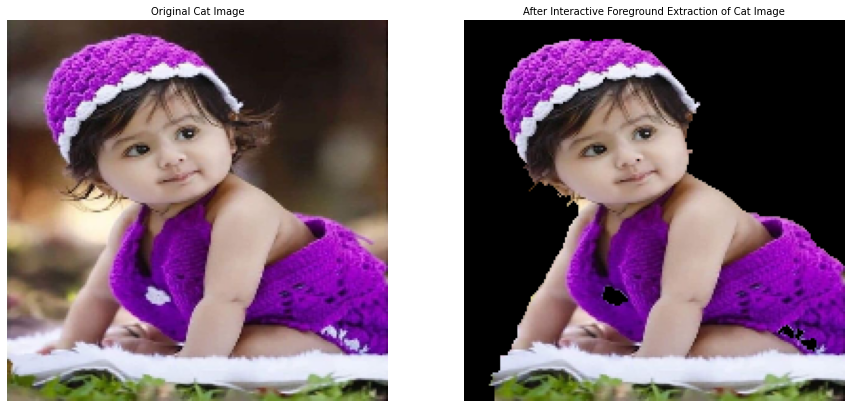

In [ ]:
img = cv2.imread('/content/baby2.jpg', cv2.IMREAD_COLOR)
img = cv2.resize(img, (height, width))
img_copy = img.copy()
mask = np.zeros(img.shape[ : 2], np.uint8)

background_model = np.zeros((1,65),np.float64)
foreground_model = np.zeros((1,65),np.float64)

rect = (10, 10, 224, 224)

cv2.grabCut(img, mask = mask, rect = rect, bgdModel = background_model, fgdModel = foreground_model, iterCount = 5, mode = cv2.GC_INIT_WITH_RECT)

new_mask = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
img = img * new_mask[:, :, np.newaxis]

plt.figure(figsize=(15, 8))
plt.subplot(1,2,1).set_title('Original Cat Image', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
plt.subplot(1,2,2).set_title('After Interactive Foreground Extraction of Cat Image', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> 

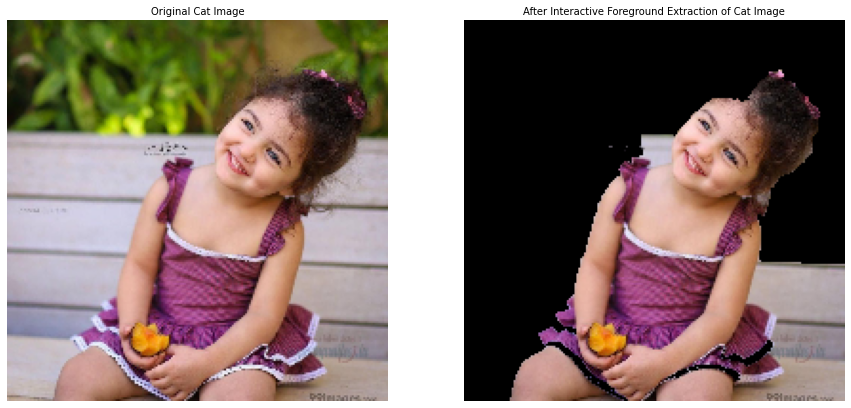

In [ ]:
img = cv2.imread('/content/bab2.jpg', cv2.IMREAD_COLOR)
img = cv2.resize(img, (height, width))
img_copy = img.copy()
mask = np.zeros(img.shape[ : 2], np.uint8)

background_model = np.zeros((1,65),np.float64)
foreground_model = np.zeros((1,65),np.float64)

rect = (10, 10, 224, 224)

cv2.grabCut(img, mask = mask, rect = rect, bgdModel = background_model, fgdModel = foreground_model, iterCount = 5, mode = cv2.GC_INIT_WITH_RECT)

new_mask = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
img = img * new_mask[:, :, np.newaxis]

plt.figure(figsize=(15, 8))
plt.subplot(1,2,1).set_title('Original Cat Image', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
plt.subplot(1,2,2).set_title('After Interactive Foreground Extraction of Cat Image', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

<h1 id = 'sec17' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🍰 IMAGE SEGMENTATION 🍰 </center> </h1>

## **IMAGE SEGMENTATION**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> To segment pictures, the Watershed Algorithm is utilised. This approach converts the grayscale picture into hills and valleys, signifying high and low intensity regions, respectively. If the valleys are filled with coloured water, as the water rises, various valleys with different coloured water will begin to merge, depending on the peaks. Walls may be created to avoid this, resulting in segmentation. This is the foundation of the Watershed algorithm. Because the user may pick which pixels belong to an object or the backdrop, this is an interactive technique. A 0 value might be used to represent pixels about which one is unsure. This is then subjected to the watershed procedure, which updates the labels and sets all of the borders to -1. The procedures for using the Watershed algorithm to segment photos are as follows.


📌Thresholding - To distinguish individual objects from the background Morphological 

📌Opening - Remove small white noises in the image 

📌Dilation - To clearly identify the image's background Distance 

📌Transform - To clearly identify the image's objects 

📌InThresholding - Finding boundaries - Subtract foreground from background The unknown region is indicated as 0 and the backdrop is designated as 1.

Note: The Distance Transform calculates the distance between a pixel and the nearest obstacle pixel.</p>

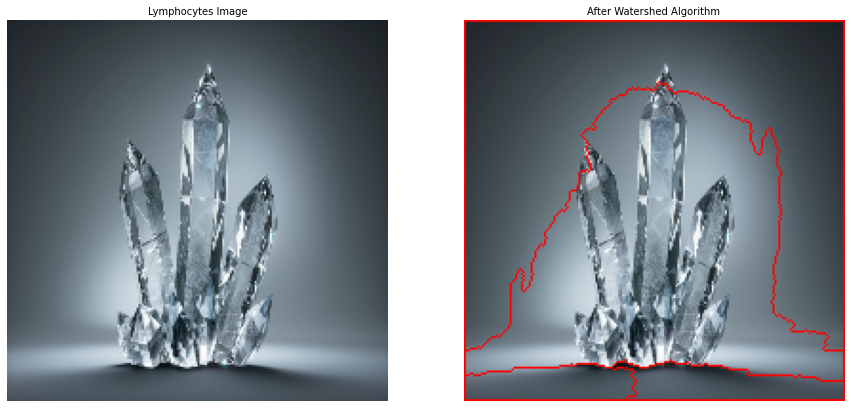

In [ ]:
kernel = np.ones((3 , 3), np.uint8)

img = cv2.imread('/content/crystal.jpg', cv2.IMREAD_COLOR)
resized_img = cv2.resize(img, (height, width))
img_copy = resized_img.copy()

gray = cv2.cvtColor(resized_img, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray, thresh = 0, maxval = 255, type = cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

opening = cv2.morphologyEx(thresh, op = cv2.MORPH_OPEN, kernel = kernel, iterations = 2)
background = cv2.dilate(opening, kernel = kernel, iterations = 5)

dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
ret, foreground = cv2.threshold(dist_transform, thresh = 0.2  * dist_transform.max(), maxval = 255, type = cv2.THRESH_BINARY)

foreground = np.uint8(foreground)
unknown = cv2.subtract(background, foreground)

ret, markers = cv2.connectedComponents(foreground)

markers = markers + 1
markers[unknown == 255] = 0

markers = cv2.watershed(resized_img, markers)
resized_img[markers == -1] = [0, 0, 255]

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1).set_title('Lymphocytes Image', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
plt.subplot(1, 2, 2).set_title('After Watershed Algorithm', fontsize = font_size); plt.axis('off')   
plt.imshow(cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB))
plt.show()

<h1 id = 'sec18' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 🎨 IMAGE INPAINTING 🎨 </center> </h1>

## **IMAGE INPAINTING**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> It's conceivable that photographs have been lost and will need to be reconstructed. There may be no pixel information in some areas of an image, for example. Image Inpainting will fill in all the missing information with the help of the surrounding pixels. One of two algorithms can be used to inpaint an image.

Image Inpainting Technique Based on the Fast Marching Method - Fast Marching Method (Explained below)
Partial differential equations, Navier-Stokes, Fluid Dynamics, and Image and Video Inpainting were all inspirations.


It starts by filling the area at the edges, then works its way inwards. It calculates the fill value as the weighted sum of all the pixels in a small neighbourhood around the inpainted pixel. The pixels closest to the target pixel are plainly given a higher weighting than those further away. The Fast Marching Method is used to repeat the operation for all remaining pixels once a pixel has been filled (FMM). FMM paints the pixels nearest to the known pixels first as a manual heuristic. An example of FFM in operation is shown below. </p>

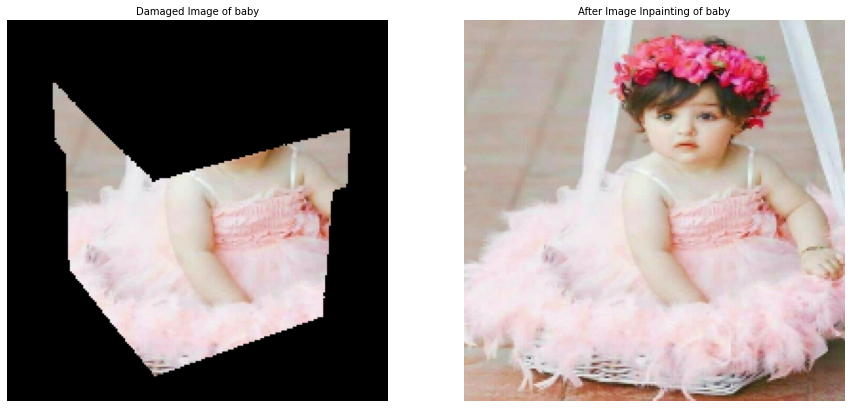

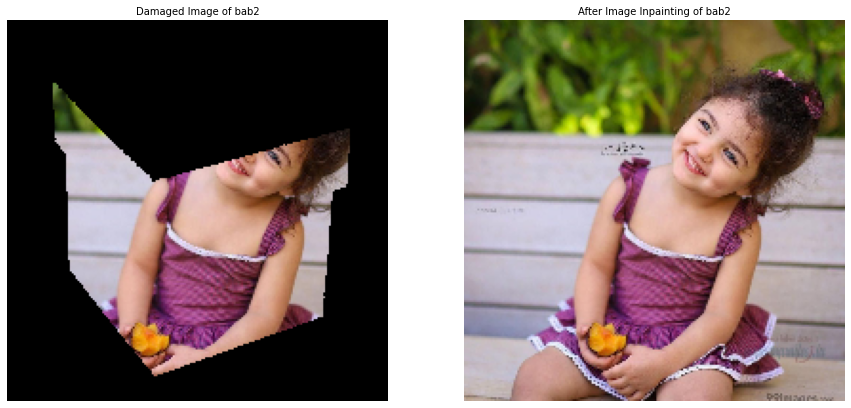

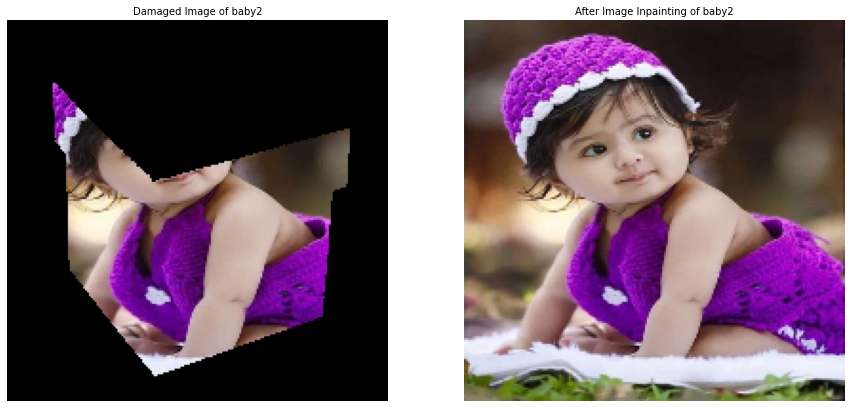

In [ ]:
mask = cv2.imread('/content/box-500x500.jpg',0)
mask = cv2.resize(mask, (height, width))

for i, path in enumerate(paths):
    
    name = os.path.split(path)[-1]
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    resized_img = cv2.resize(img, (height, width))
    
    ret, th = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
    inverted_mask = cv2.bitwise_not(th)
    damaged_img = cv2.bitwise_and(resized_img, resized_img, mask = inverted_mask)
    
    result = cv2.inpaint(resized_img, mask, inpaintRadius = 3, flags = cv2.INPAINT_TELEA)


    plt.figure(figsize=(15, 8))
    plt.subplot(1, 2, 1).set_title(f'Damaged Image of {name[ : -4]}', fontsize = font_size); plt.axis('off')   
    plt.imshow(cv2.cvtColor(damaged_img, cv2.COLOR_BGR2RGB))
    plt.subplot(1, 2, 2).set_title(f'After Image Inpainting of {name[ : -4]}', fontsize = font_size); plt.axis('off')   
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.show()

<h1 id = 'sec19' style = 'background-color:purple;color:white;font-family:COMIC SANS MS'> <center> 👩 TEMPLATE MATCHING 👩 </center> </h1>

## **TEMPLATE MATCHING**

<p style = 'background-color:black;color:white;font-family:Georgia;font-size:18px'> Template Matching matches the provided template to the image where it needs to be placed. The template is compared to each patch of the supplied image. A two-dimensional convolution technique is equivalent to this. It generates a grayscale image in which each pixel reflects the degree of similarity between adjacent pixels and the template. This output is used to compute the maximum and minimum values. This is the coordinates for the rectangle's top-left corner. When the width and height of the template are taken into consideration, the resultant rectangle is the region of the template in the picture. </p>

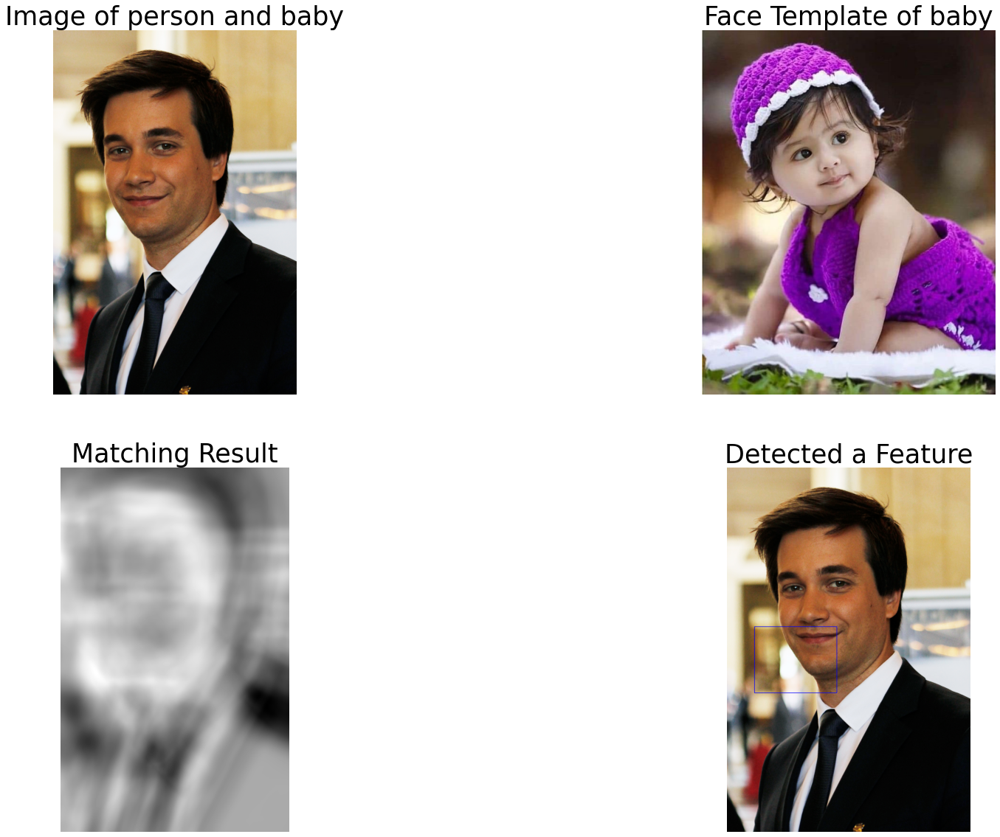

In [ ]:
img = cv2.imread('/content/Pierre-Person.jpg', cv2.IMREAD_COLOR)
img_copy = img.copy()
template = cv2.imread('/content/baby2.jpg', cv2.IMREAD_COLOR)
w, h, c = template.shape

method = eval('cv2.TM_CCOEFF')

result = cv2.matchTemplate(img, templ = template, method = method)
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

top_left = max_loc

bottom_right = (top_left[0] + w, top_left[1] + h)

cv2.rectangle(img, top_left, bottom_right, color = (255, 0, 0), thickness = 3)

plt.figure(figsize=(30, 20))
plt.subplot(2, 2, 1).set_title('Image of person and baby', fontsize = 35); plt.axis('off')
plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
plt.subplot(2, 2, 2).set_title('Face Template of baby', fontsize = 35); plt.axis('off')
plt.imshow(cv2.cvtColor(template, cv2.COLOR_BGR2RGB))
plt.subplot(2, 2, 3).set_title('Matching Result', fontsize = 35); plt.axis('off')
plt.imshow(result, cmap = 'gray')
plt.subplot(2, 2, 4).set_title('Detected a Feature', fontsize = 35); plt.axis('off')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()